## Analyzing Linear Dynamics

One way to approach transforming an SSP is by replicating a simple dynamical system like a 1D oscillator, but in SSP space. If we have a vector encoding the system state as the position $p$ and the velocity $v$, such that $x = [p, v]$, then the following matrix will implement a simple oscillation:

\begin{equation*}
A = 
\begin{pmatrix}
1 & \omega   \\
-\omega & 1 
\end{pmatrix}
\end{equation*}

Intuitively, the first row of the matrix updates the position in the state vector by returning the current position while adding in the current velocity, $v$, times $\omega$. The second row updates the velocity in the state vector by returning the current velocity while subtracting out the current position, $p$, times $\omega$. Thus, the velocity that determines the object's dynamics changes as a function of its position, rather than as a function of time, as in our earlier examples. 

Ideally, we'd be be able to encode position and velocity in an SSP, and then apply a transformation that does the equivalent to $A$ above, but using algebraic SSP operations. One obvious challenge is that the operation will have to perform multiplications with the continuous values encoded by a given SSP. More specifically, if we encode position as $X^p$ and velocity as $X^{v}$, then the update performed to position should be:

$X^{p + \omega v} = X^p \circledast X^{v^{\omega}}$

while, the update performed to velocity should be:

$X^{v - \omega p} = X^v \circledast X^{p^{- \omega}}$

The drawback of this approach is that generally speaking, $(X^a)^b \neq X^{a * b}$ for SSPs due to fractional exponentials being multivalued. To get around this, we can try to approximate functions that perform sub-components of the overall operation we want to perform on each SSP encoding. 

In [1]:
%matplotlib inline
import numpy as np
import nengo_spa as spa
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML, display

from ssp.maps import Spatial2D
from ssp.dynamics import Trajectory
from ssp.models import Linear, MLP
from ssp.plots import heatmap_animation
from ssp.plots import create_gif
from ssp.utils import create_data

In [2]:
dim = 256
scale = 10

t = 10
dt = 0.05
n_steps = int(t / dt)

ssp_map = Spatial2D(dim=dim, scale=scale)

### 1. Verify Implementation in Coordinate Space

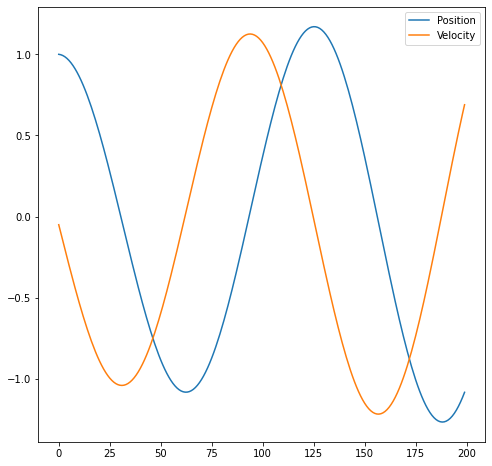

In [3]:
A = np.array([[1, dt], [-dt, 1]])  
state = np.array([1, 0])

ps = []
vs = []
for steps in range(n_steps):
    state = np.dot(A, state)
    ps.append(state[0])
    vs.append(state[1])
    
    
plt.figure(figsize=(8, 8))
plt.plot(ps)
plt.plot(vs)
plt.legend(['Position', 'Velocity'])
plt.show()

### 2. Implement Row-Column Inner Product Approximators for Dynamics Matrix

Here, we'll try to learn functions that compute the elementary operations involved in applying the dynamics matrix $A$ to the state vector $x$. To compute the change in the position encoding, we want the following:

$ X^{p + \omega v} = f_p(X^p, X^v)$

while to compute the change to the velocity encoding, we want:

$ X^{v - \omega p} = f_v(X^p, X^v)$

We can implement $f_p$ and $f_v$ using the model types defined in earlier work, and provided input to each model by concatenating the encodings of $X^p$ and $X^v$

In [4]:
# initial state encodings
pos = ssp_map.X ** (1 * scale)
vel = ssp_map.X ** (0 * scale)

pos_model = MLP(2 * dim, dim, dim)
vel_model = MLP(2 * dim, dim, dim)

# make some training data and train models
xs = []
pos_ys = []
vel_ys = []

for p, v in zip(ps, vs):
    p_ssp = ssp_map.X ** (p * scale)
    v_ssp = ssp_map.X ** (v * scale)

    x = np.concatenate((p_ssp.v, v_ssp.v))
    
    # first row of matrix performs f(p, v) -> X^(p + wv)
    pos_y = ssp_map.X ** ((p + dt * v) * scale)
    
    # second row of matrix perform f(p, v) -> X^(v - wp)
    vel_y = ssp_map.X ** ((v - dt * p) * scale)
    
    xs.append(x)
    pos_ys.append(pos_y.v)
    vel_ys.append(vel_y.v)
    

# stack arrays for tensorflow
xs = np.vstack(xs)
pos_ys = np.vstack(pos_ys)
vel_ys = np.vstack(vel_ys)
    
# train each model for a while
pos_model.train(xs, pos_ys, n_steps=1000)
vel_model.train(xs, vel_ys, n_steps=1000)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

In [5]:
# make tiling over 1D space for computing SSP sims
tiling = 151
space = np.linspace(-2, 2, tiling)
array = np.zeros((tiling, dim))

for i, point in enumerate(space):
    ssp = ssp_map.X ** (point * scale)
    array[i, :] = ssp.v

# now simulate the dynamics using learned functions
# squeezing/expanding is because models expect 2D inputs
state = np.concatenate((pos.v, vel.v))[np.newaxis, :]
p_sims = []
v_sims = []
for steps in range(n_steps):
    pos = np.squeeze(pos_model(state))
    vel = np.squeeze(vel_model(state))
    
    # compute position update with cleanup
    comps = np.dot(array, pos)
    index = np.argmax(comps)
    point = ssp_map.X ** (space[index] * scale)
    
    # compute velocity update with cleanup
    comps = np.dot(array, vel)
    index = np.argmax(comps)
    veloc = ssp_map.X ** (space[index] * scale)
    
    # update state
    state = np.concatenate((point.v, veloc.v))[np.newaxis, :]

    # score point encoding against grid tiling
    p_sims.append(np.dot(array, point.v))
    v_sims.append(np.dot(array, veloc.v))


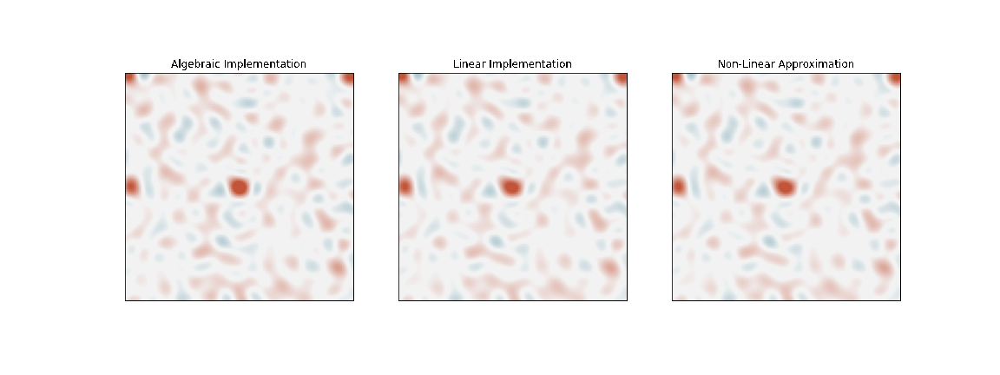

In [6]:
def plot(p_sims, v_sims):
    fig, ax = plt.subplots()
    images = []
    for step in range(len(p_sims)):
        lines = ax.plot(
            np.arange(tiling),
            p_sims[step], 'b',
            np.arange(tiling),
            v_sims[step], 'r',
            animated=True)
       
        images.append(lines)

    ax.set_xticks([])
    plt.legend(['Position', 'Velocity'])
    ani = animation.ArtistAnimation(fig, images, interval=50, blit=True)
    plt.close()
    return ani

HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(plot(p_sims, v_sims))))

### 3. Check Approximations that Only Use Position Info

With function approximation, we can often do a good job just mapping one SSP to the next to simulate a path over some trajectory, so it's worth checking whether the use of both velocity and position info is necessary in this context. Presumably the answer to this question is yes, since the position encoding alone underdetermines whether the next step in the trajectory involves moving the left vs the right. 

In [7]:
xs = []
ys = []

model = MLP(dim, dim, dim)

for p, v in zip(ps, vs):
    p_ssp = ssp_map.X ** (p * scale)
    v_ssp = ssp_map.X ** (v * scale)
    
    # always just try to predict the next position
    x = p_ssp
    y = ssp_map.X ** ((p + dt * v) * scale)
    
    xs.append(x.v)
    ys.append(y.v)
    
xs = np.vstack(xs)
ys = np.vstack(ys)
    
model.train(xs, ys, n_steps=1000)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

In [8]:
# now simulate the dynamics using learned functions
pos = ssp_map.X ** (1 * scale)
state = pos.v[np.newaxis, :]
sims = []
for steps in range(n_steps):
    state = np.squeeze(model(state))
    
    # compute position update with cleanup
    comps = np.dot(array, state)
    index = np.argmax(comps)
    point = ssp_map.X ** (space[index] * scale)
    
    # score point encoding against grid tiling
    sims.append(np.dot(array, point.v))
    state = state[np.newaxis, :]


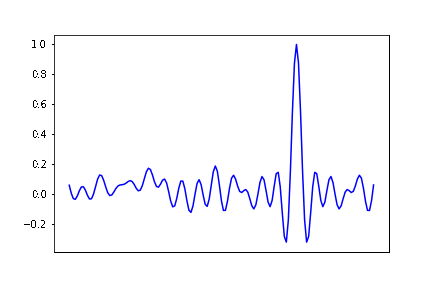

In [9]:
fig, ax = plt.subplots()
images = []
for step in range(len(sims)):
    lines = ax.plot(
        np.arange(tiling),
        sims[step], 'b',
        animated=True)

    images.append(lines)

ax.set_xticks([])
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True)
plt.close()

HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

### 4. Check Approximation with Sum instead of Concatenation

Using position info alone fails as expected, but it may be possible to just add in the velocity encoding to the position encoding such that the inputs and outputs of the approximator are of the same dimension. 

In [10]:
xs = []
ys = []

model = MLP(dim, dim, dim)

p_array = np.zeros((tiling, dim))
v_array = np.zeros((tiling, dim))

# use different base SSPs in this case (X for p, Y for v)
for i, point in enumerate(space):
    p_ssp = ssp_map.X ** (point * scale)
    v_ssp = ssp_map.Y ** (point * scale)
    p_array[i, :] = p_ssp.v
    v_array[i, :] = v_ssp.v

for p, v in zip(ps, vs):
    p_ssp = ssp_map.X ** (p * scale)
    v_ssp = ssp_map.Y ** (v * scale)
    
    x = p_ssp + v_ssp
    y = ssp_map.X ** ((p + dt * v) * scale) + ssp_map.Y **((v - dt * p) * scale)
    
    xs.append(x.v)
    ys.append(y.v)
    
xs = np.vstack(xs)
ys = np.vstack(ys)
    
model.train(xs, ys, n_steps=1000)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.


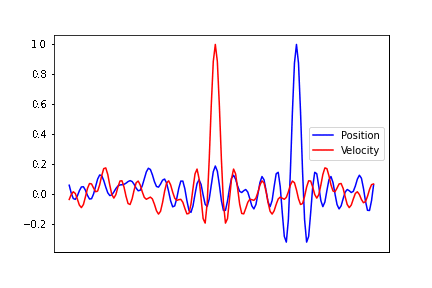

In [11]:
# now simulate the dynamics using learned functions
state = ssp_map.X ** (1 * scale) + ssp_map.Y ** (0 * scale)

p_sims = []
v_sims = []
for steps in range(n_steps):
    state = np.squeeze(model(state.v[np.newaxis, :]))
    
    # compute position update with cleanup
    comps = np.dot(p_array, state)
    index = np.argmax(comps)
    pos = ssp_map.X ** (space[index] * scale)
    
    # compute velocity update with cleanup
    comps = np.dot(v_array, state)
    index = np.argmax(comps)
    vel = ssp_map.Y ** (space[index] * scale)

    # score point encoding against grid tiling
    p_sims.append(np.dot(p_array, pos.v))
    
    # score veloc encoding against grid tiling
    v_sims.append(np.dot(v_array, vel.v))

    state = pos + vel
    
HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(plot(p_sims, v_sims))))

This seems to break by fixing both the position and velocity encodings at zero after a while (i.e., the identity SSP). I'm not sure why this happens, but maybe because both axes (X and Y) share the same zero encoding in the form of the identity SSP? Need to investigate, could be a bug somewhere....

### 5. Implement SSP Encoding Multiplication via Approximation, Addition via Convolution

The idea behind this approach is that we want to apply $A$ to a state vector $x$, where the values in $x$ are encoded as SSPs, and the operations performed by $A$ are transformations of these SSPs. Assuming the entries in $A$ and $x$ are all encoded as SSPs, we have two operations we want to perform: (a) multiplication an entry in $A$ by a corresponding entry in $x$, and (b) summation of the results of two or more such multiplications. In short, we want an SSP analogue of the basic MAC operation used in neural network implementations.

For the accumulations or summations, we can use convolution, since:

$X^{a+b} = X^a \circledast X^{b}$

For multiplications, we can try and learn a function that implements the following:

$X^{a \cdot b} = f_{m}(X^a, X^b)$

Ideally, this would be a generic "multiplier" network that could be reused to compute outputs for arbitrary $a$ and $b$ values. Together, these two operations could implement the basic row-vector dot products that are involved in evaluating $Ax$. 

I'm not sure learning this will work, since we might be forcing the model to learn contradictory outputs for the same inputs for the same reason that we can't algebraically define a multiplication operation (i.e. fractional exponentiation is multivalued). But then again, since we're not inverting the multiplication, $f_m$ should be uniquely defined for every input pair.

In [12]:
import itertools

xs = []
ys = []

mult_model = MLP(2 * dim, 2 * dim, dim)

mult_samps = np.linspace(-0.1, 0.1, 21)

# multiply all axis points with sample values to get training data
for a, b in itertools.product(ps, mult_samps):
    a_ssp = ssp_map.X ** (a * scale)
    b_ssp = ssp_map.X ** (b * scale)
    
    x = np.concatenate((a_ssp.v, b_ssp.v))
    
    mult = ssp_map.X ** (a * b * scale)
    y = mult.v
    
    xs.append(x)
    ys.append(y)
    
xs = np.vstack(xs)
ys = np.vstack(ys)
    
mult_model.train(xs, ys, n_steps=2000)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

In [13]:
# now try and implement matrix multiplication with trained model
def matmul(A, state):
    pos_enc, vel_enc = state
    
    # for now just multiply with omega terms, don't both with identity ops
    p_mult = A[0, 1]
    v_mult = A[1, 0]
    
    p_mult_enc = ssp_map.X ** (p_mult * scale)
    v_mult_enc = ssp_map.X ** (v_mult * scale)
    
    p_mult_inp = np.concatenate((vel_enc.v, p_mult_enc.v))[np.newaxis, :]
    v_mult_inp = np.concatenate((pos_enc.v, v_mult_enc.v))[np.newaxis, :]
    
    # create SSPs from multiplication outputs
    p_mult_out = spa.SemanticPointer(np.squeeze(mult_model(p_mult_inp)))
    v_mult_out = spa.SemanticPointer(np.squeeze(mult_model(v_mult_inp)))

    # now sum via convolution to get next state
    pos_enc = pos_enc * p_mult_out
    vel_enc = v_mult_out * vel_enc

    state = [pos_enc, vel_enc]
    return state


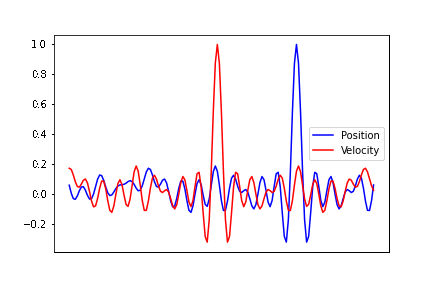

In [14]:
# initial state encodings
pos = ssp_map.X ** (1 * scale)
vel = ssp_map.X ** (0 * scale)

state = [pos, vel]

p_sims = []
v_sims = []

for steps in range(n_steps):
    noisy_state = matmul(A, state)
    
    # compute position update with cleanup
    comps = np.dot(array, noisy_state[0].v)
    index = np.argmax(comps)
    pos = ssp_map.X ** (space[index] * scale)
    
    # compute velocity update with cleanup
    comps = np.dot(array, noisy_state[1].v)
    index = np.argmax(comps)
    vel = ssp_map.X ** (space[index] * scale)

    # score clean encodings against grid tilings
    p_sims.append(np.dot(array, pos.v))
    v_sims.append(np.dot(array, vel.v))

    # reset state to clean encodings
    state = [pos, vel]
    
HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(plot(p_sims, v_sims), fname='1D.gif')))

### 6. Simplify this "SSP MAC" Implementation

The above example is using SSPs to perform "multiply-accumulate" operations one a one-by-one basis (i.e., each value in the state vector and the matrix A is represented with a seperate SSP). It would be good if we could combine elements of this MAC operation to simplify a network implementation of this approach to simulating dynamics. 

One way to do this involves batching inputs to the multiplier, so that all multiplications are done in one shot. This still requires all values to be represented with seperate SSPs, though, and introduces the need to do bookkeeping on the batched output to perform the subsequent addiition operations (via convolution). 

Another option involves applying the multiplication with a sum of SSPs, with the hope that the resulting "cross-multiplications" will be like noise terms that we remove with cleanup. This might work since we are using different base vectors to represent corresponding entries in $A$ and $x$. 

Update: this doesn't really work as envisioned because with different base vectors for encoding position and velocity, convolution can't be used to implement accumulation when computing vector-row dot products with $A$ and $x$. Getting around this as planned also doesn't work, so clearly a bug or something somewhere.

In [15]:
xs = []
ys = []
for (p, v), m in itertools.product(zip(ps, vs), mult_samps):
    p_ssp = ssp_map.X ** (p * scale)
    v_ssp = ssp_map.Y ** (v * scale)
    
    # train on base vectors seperately
    a = p_ssp + v_ssp
    b1 = ssp_map.X ** (m * scale) 
    b2 = ssp_map.Y ** (m * scale)    

    # training inputs
    x1 = np.concatenate((a.v, b1.v))
    x2 = np.concatenate((a.v, b2.v))
    
    # training targets
    y1 = ssp_map.X ** (p * m * scale)
    y2 = ssp_map.Y ** (v * m * scale)
    
    xs += [x1, x2]
    ys += [y1.v, y2.v]
    

xs = np.vstack(xs)
ys = np.vstack(ys)

model = MLP(2 * dim, dim, dim)
model.train(xs, ys, n_steps=2000)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

In [16]:
def simple_matmul(matrix, state):
    
    row_a = ssp_map.X ** (A[0, 0] * scale) + ssp_map.Y ** (A[0, 1] * scale)
    row_b = ssp_map.X ** (A[1, 0] * scale) + ssp_map.Y ** (A[1, 1] * scale)
        
    a_inp = np.concatenate((state.v, row_a.v))[np.newaxis, :]
    b_inp = np.concatenate((state.v, row_b.v))[np.newaxis, :]
    
    a_out = np.squeeze(model(a_inp))
    b_out = np.squeeze(model(b_inp))
    
    # can't convolve to perform exponent addition because different axes :(
    p_old = np.argmax(np.dot(p_array, a_out))
    p_inc = np.argmax(np.dot(v_array, a_out))
    
    # cleanup and re-encode (this kind of defeats the purpose of this approach)
    v_old = np.argmax(np.dot(v_array, b_out))
    v_inc = np.argmax(np.dot(p_array, b_out))
    
    new_pos = ssp_map.X ** ((p_old + p_inc) * scale)
    new_vel = ssp_map.Y ** ((v_old + v_inc) * scale)
    
    state = new_pos + new_vel
    return state


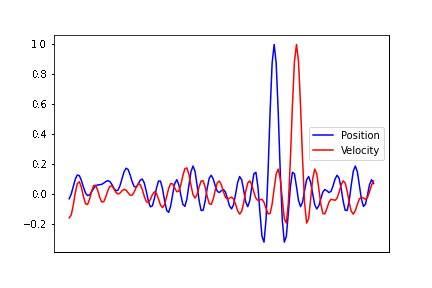

In [17]:
state = ssp_map.X ** (1 * scale) + ssp_map.Y ** (0 * scale)

p_sims = []
v_sims = []

for steps in range(n_steps):
    state = simple_matmul(A, state)
    
    # compute position update with cleanup
    comps = np.dot(p_array, state.v)
    index = np.argmax(comps)
    pos = ssp_map.X ** (space[index] * scale)
    
    # compute velocity update with cleanup
    comps = np.dot(v_array, state.v)
    index = np.argmax(comps)
    vel = ssp_map.Y ** (space[index] * scale)

    # score clean encodings against grid tilings
    p_sims.append(np.dot(p_array, pos.v))
    v_sims.append(np.dot(v_array, vel.v))

    # reset state to clean encodings
    state = pos + vel
    
HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(plot(p_sims, v_sims), fname='1D.gif')))